# Homework 2

For this assignment, you will be developing an artificial neural network to classify data given in the __[Dry Beans Data Set](https://archive.ics.uci.edu/ml/datasets/Dry+Bean+Dataset#)__. This data set was obtained as a part of a research study by Selcuk University, Turkey, in which a computer vision system was developed to distinguish seven different registered varieties of dry beans with similar features. More details on the study can be found in the following __[research paper](https://www.sciencedirect.com/science/article/pii/S0168169919311573)__.

## About the Data Set For Q1
Seven different types of dry beans were used in a study in Selcuk University, Turkey, taking into account the features such as form, shape, type, and structure by the market situation. A computer vision system was developed to distinguish seven different registered varieties of dry beans with similar features in order to obtain uniform seed classification. For the classification model, images of 13611 grains of 7 different registered dry beans were taken with a high-resolution camera. Bean images obtained by computer vision system were subjected to segmentation and feature extraction stages, and a total of 16 features - 12 dimensions and 4 shape forms - were obtained from the grains.

Number of Instances (records in the data set): __13611__

Number of Attributes (fields within each record, including the class): __17__

### Data Set Attribute Information:

1. __Area (A)__ : The area of a bean zone and the number of pixels within its boundaries.
2. __Perimeter (P)__ : Bean circumference is defined as the length of its border.
3. __Major axis length (L)__ : The distance between the ends of the longest line that can be drawn from a bean.
4. __Minor axis length (l)__ : The longest line that can be drawn from the bean while standing perpendicular to the main axis.
5. __Aspect ratio (K)__ : Defines the relationship between L and l.
6. __Eccentricity (Ec)__ : Eccentricity of the ellipse having the same moments as the region.
7. __Convex area (C)__ : Number of pixels in the smallest convex polygon that can contain the area of a bean seed.
8. __Equivalent diameter (Ed)__ : The diameter of a circle having the same area as a bean seed area.
9. __Extent (Ex)__ : The ratio of the pixels in the bounding box to the bean area.
10. __Solidity (S)__ : Also known as convexity. The ratio of the pixels in the convex shell to those found in beans.
11. __Roundness (R)__ : Calculated with the following formula: (4piA)/(P^2)
12. __Compactness (CO)__ : Measures the roundness of an object: Ed/L
13. __ShapeFactor1 (SF1)__
14. __ShapeFactor2 (SF2)__
15. __ShapeFactor3 (SF3)__
16. __ShapeFactor4 (SF4)__

17. __Classes : *Seker, Barbunya, Bombay, Cali, Dermosan, Horoz, Sira*__

### Libraries that can be used :
- NumPy, SciPy, Pandas, Sci-Kit Learn, TensorFlow, Keras
- Any other library used during the lectures and discussion sessions.

## About the Data Set For Q3
In this problem, we will be exploring the car dataset and analyzing their fuel efficiency. <br >
Specifically, we will do some exploratory analysis with visualizations, then we will build a model for Simple Linear Regression, a model for Polynomial Regression, and one model for Logistic Regression. <br >
**The given dataset is already modified and cleaned**, but you can find [the original information here.](https://archive.ics.uci.edu/ml/datasets/auto+mpg).

## Dataset Attribute Information

1. **mpg**: Miles per gallon. This is one primary measurement for car fuel efficiency.
2. **displacement** : The cylinder volumes in cubic inches.
3. **horsepower** : Engine power.
4. **weight** : In pounds.
5. **acceleration** : The elapsed time in seconds to go from 0 to 60mph.
6. **origin** : Region of origin.

### Libraries that can be used: numpy, pandas, scikit-learn, seaborn, plotly, matplotlib
Any libraries used in the discussion materials are also allowed.


### Other Notes
- Don't worry about not being able to achieve high accuracy, it is neither the goal nor the grading standard of this assignment.
- Discussion materials should be helpful for doing the assignments.
- The homework submission should be a .ipynb file.


## Exercise 1 : Data Understanding (23 points in total)
* As the classes are categorical, use one-hot encoding to represent the set of classes. 
* Normalize each field of the input data using the min-max normalization technique.
* Plot the distribution of data and analyze the distribution. Explain if the data is symmetric, or sekewed to right or left. 
* Plot the target (class) variable and show if data has linear or non-linear behavior. Suggest whether a linear or non-linear model should be developed for the data. 
    * hints: After normalizing the input variables, for each pair of input variables (xi, xj), create a 2D pair-plot between the variables, and color-code the target variable according to the label of the target variable (for example you can use red for y="sira"). Then analyze the relationship between the input variables and the target variable to see if you can find a linear no non-linear line to separate the data points according to the target variable class. For each combination of input variables, create a separate pair plot. Pair plot has been discussed in the HW1 discussion. 

# Print Attributes and Classes

In [2]:
import sys
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

# Trigger full representation of array elements without summarization 
np.set_printoptions(threshold=sys.maxsize)

# Call in our beans dataset for explorastory analysis
beans_ds = pd.read_csv("Dry_Beans_Dataset.csv")

# Remove the `species` attribute from our Dry Beans dataframe (since it is the class attribute)
# Store `species` in a separate variable `y`
X = beans_ds.drop('Class', axis = 1)
y = beans_ds['Class']
print('--All 16 attributes--')
print(X)
print('--Classes--')
print(y)

--All 16 attributes--
         Area  Perimeter  MajorAxisLength  MinorAxisLength  AspectRation  \
0       44830    814.955       320.731947       178.405838      1.797766   
1       33476    691.826       258.837971       165.220760      1.566619   
2       27057    606.138       227.460904       151.860320      1.497830   
3       49483    844.283       326.602913       194.689529      1.677558   
4       22461    544.584       192.801303       148.541136      1.297966   
...       ...        ...              ...              ...           ...   
13606   39956    745.166       273.867402       186.564001      1.467954   
13607  171914   1595.676       598.541646       368.358372      1.624889   
13608   48266    817.340       304.682706       202.282198      1.506226   
13609   43279    843.066       336.280446       164.667135      2.042183   
13610   46856    809.173       302.595376       197.920303      1.528875   

       Eccentricity  ConvexArea  EquivDiameter    Extent  Solidit

# Create a One Hot Encoding of Observations by their Class Label

In [3]:
# Return the count of unique rows in `y`, the attributes, then index as a list
set_of_classes = y.value_counts().index.tolist()

# Take this list with the count of unique class rows, and label it in a pandas dataframe with `Class`
set_of_classes= pd.DataFrame({'Class': set_of_classes})

# Create a dummy variable of `y`, of integer type. Returns as 0 and 1. This is for the one hot encoder! Selects one class as true, others as false, for a given row in y_dum
# Refer to examples at: https://pandas.pydata.org/docs/reference/api/pandas.get_dummies.html#pandas-get-dummies
y_dum = pd.get_dummies(y,dtype=int)

# Initialize a one hot decoder, then make a one hot decoder based on the class dataframe (the y variable) 
oec = OneHotEncoder()
y_onehot = oec.fit(np.asarray(y).reshape(-1, 1))
y_onehot = oec.transform(np.asarray(y).reshape(-1, 1)).toarray()

print("Pre-processed class :")
print(y)
print('The classes represented as a one hot encoding. Each observation. with its class label, is represented as 1 of the 7 classes through one-hot.')
print('We\'ll observer only the first 10, since the input would be too lengthy otherwise. Should be good enough to crossvalidate')
for i in range(0, 10):
    print(f"Observation {i + 1}: {y_onehot[i]}")
print('And the first 10 classes... looks like the one-hot encoding is accurate.')
for i in range(0, 10):
    print(f"Observation {i + 1}: {y[i]}")

Pre-processed class :
0            SIRA
1        DERMASON
2        DERMASON
3            SIRA
4        DERMASON
           ...   
13606    DERMASON
13607      BOMBAY
13608        SIRA
13609       HOROZ
13610        SIRA
Name: Class, Length: 13611, dtype: object
The classes represented as a one hot encoding. Each observation. with its class label, is represented as 1 of the 7 classes through one-hot.
We'll observer only the first 10, since the input would be too lengthy otherwise. Should be good enough to crossvalidate
Observation 1: [0. 0. 0. 0. 0. 0. 1.]
Observation 2: [0. 0. 0. 1. 0. 0. 0.]
Observation 3: [0. 0. 0. 1. 0. 0. 0.]
Observation 4: [0. 0. 0. 0. 0. 0. 1.]
Observation 5: [0. 0. 0. 1. 0. 0. 0.]
Observation 6: [0. 1. 0. 0. 0. 0. 0.]
Observation 7: [0. 0. 0. 1. 0. 0. 0.]
Observation 8: [0. 0. 0. 1. 0. 0. 0.]
Observation 9: [1. 0. 0. 0. 0. 0. 0.]
Observation 10: [0. 0. 0. 0. 0. 0. 1.]
And the first 10 classes... looks like the one-hot encoding is accurate.
Observation 1: SIRA
Ob

# Normalize Input Data Fields

In [4]:
# Take our 16 attributes, and normalize their input fields with the MinMaxScaler() function.
scaler = MinMaxScaler(feature_range=(0, 1))
X_rescaled = scaler.fit_transform(X)

# Load in the newly scaled attributes into a new Dataframe 
X_rescaled = pd.DataFrame(data = X_rescaled, columns = X.columns)

print('Normalized, 16-attribute dataset: \n', X_rescaled)

Normalized, 16-attribute dataset: 
            Area  Perimeter  MajorAxisLength  MinorAxisLength  AspectRation  \
0      0.104229   0.198694         0.246967         0.165518      0.549934   
1      0.055748   0.114396         0.135499         0.126473      0.385468   
2      0.028340   0.055731         0.078990         0.086908      0.336523   
3      0.124097   0.218773         0.257541         0.213740      0.464403   
4      0.008715   0.013589         0.016569         0.077079      0.194315   
...         ...        ...              ...              ...           ...   
13606  0.083417   0.150914         0.162566         0.189677      0.315266   
13607  0.646868   0.733202         0.747292         0.728031      0.426928   
13608  0.118900   0.200327         0.218063         0.236224      0.342497   
13609  0.097606   0.217940         0.274969         0.124833      0.723842   
13610  0.112880   0.194735         0.214304         0.223307      0.358612   

       Eccentricity  Convex

# Plotted Data Distribution, and Analysis

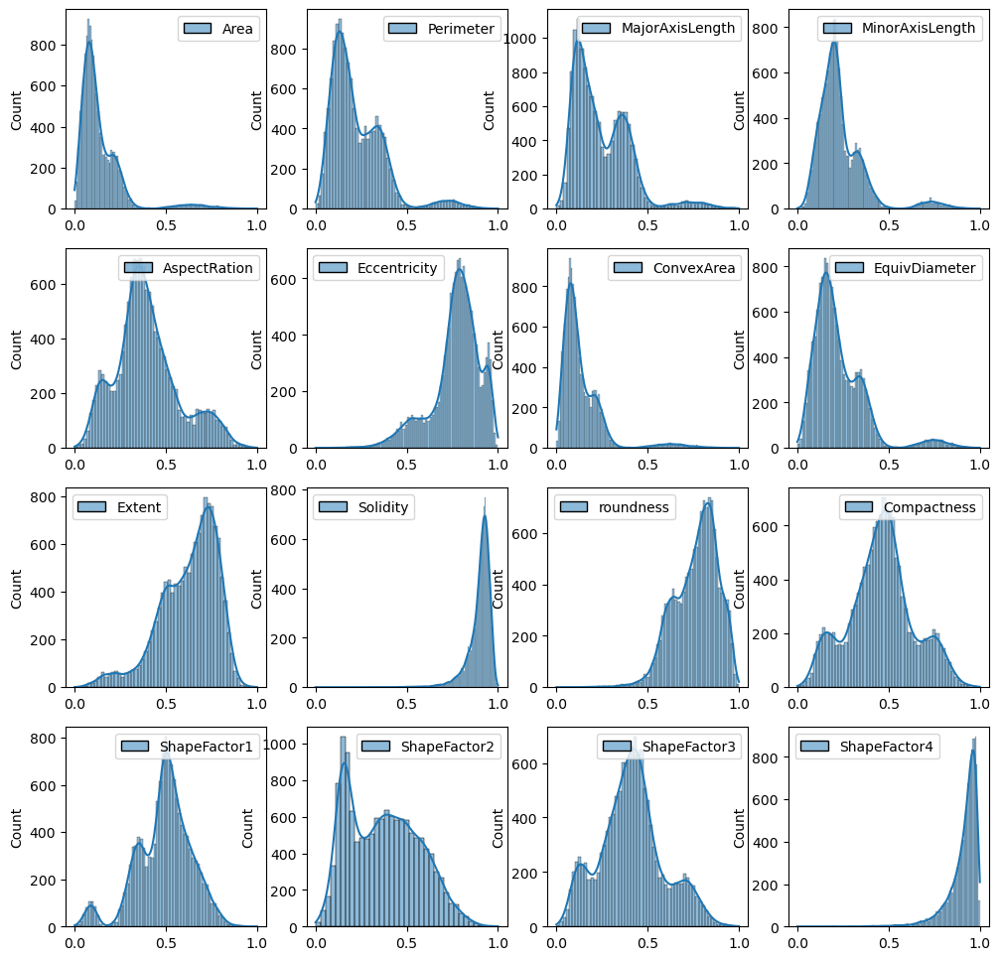

In [5]:
# Modify this code to support a 16-attribute subplot
fig, axes = plt.subplots(4,4, figsize=(12,12))
axes = axes.flatten()

# Loop to create subplots
i = 0
for item in X_rescaled.items():
    sns.histplot(item, kde=True, ax=axes[i])
    i+=1

plt.show()

# Analysis of Attribute Distributions
* Next to none of our attribute datasets match a normalized distribution. Much of the dataset is asymmetric, notably ShapeFactor4, Soliditiy, ConvexArea, Eccentricity, and MinorAxis Length.
* Data which does exhibit some symmetrical properites is left-skewed or right-skewed. Area, Perimeter, MajorAxisLength, MinorAxisLength, and more are such examples.
* The dataset should be treated with an outlier suppression, using something like an Interquartile Range threshold. Could also create some Box Plots, or make a One-Class-Support-Vector-Machine. Either of these methods should be able to effectively remove outliers and get some better distributions. 
* Only Compactness and ShapeFactor3 have a relatively normal distribution, and should not be treated for outlier suppression.

# Determining Class Linearity or Non-Linearity

D:\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


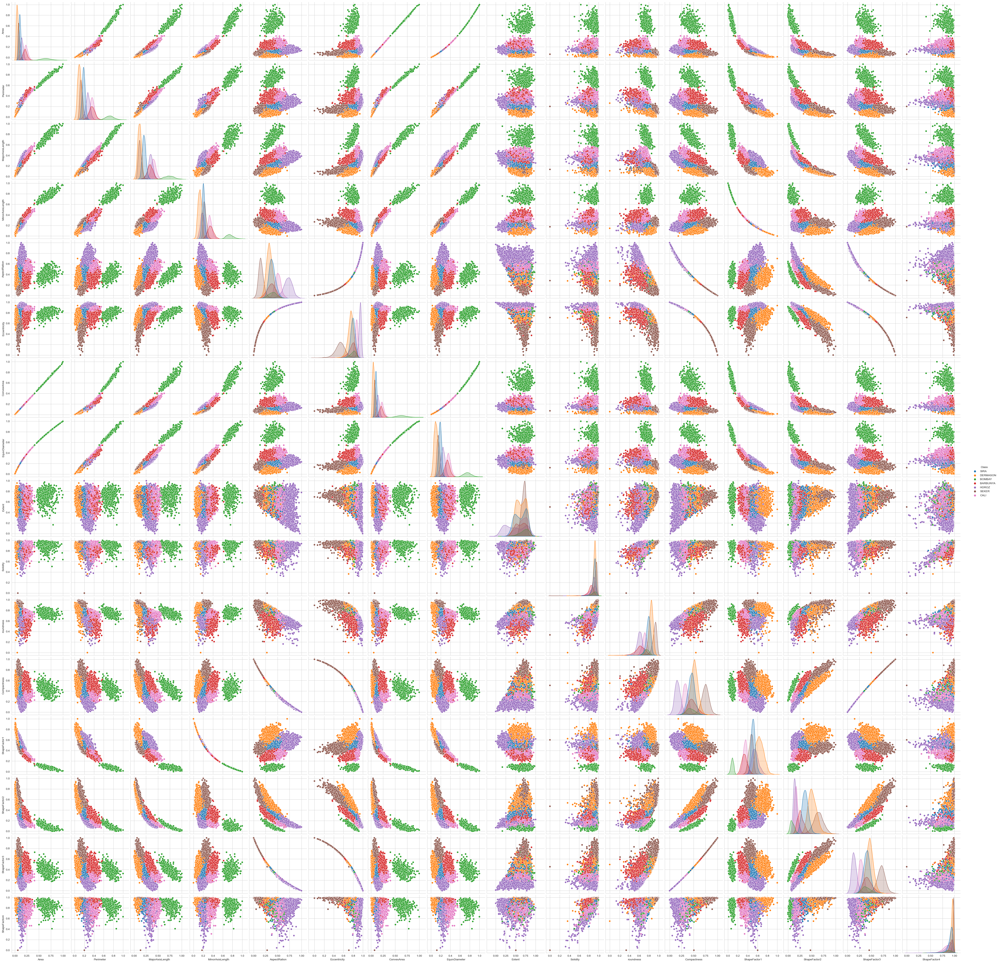

In [7]:
# `hue` parameter requires a categorical variable from the passed-in DataFrame (X_rescaled). Need to re-incorporate 'Class' column
X_rescaled['Class'] = y

# Now, we have the original dataset as a DataFrame, including the 'Class' attribute, but the first 16 attributes are normalized for [0,1] w.r.t. that particular attribute

# Create a pairplot. Every attribute combined with the other 16, including itself (that is, 16^2 combinations). Hue indicates what class that observation belongs to. 
plt.close();
sns.set_style("whitegrid");
sns.pairplot(X_rescaled, hue="Class", height=3);
plt.show()

# Analysis of Pair-Plot
* The pair plot indicates a class relationship between two attributes. There are 13,611 observations. That is, 13,611 beans; each of which have 16 attribute parameters (and have been classified with a 17th attribute parameter, based on the previous 16 attributes).
* Row-to-row: Row 1 indicates the `Area` attribute (all 13,611 members) vs. every other attribute. For example, the first 3 columns are respectively: Area vs. Area, Area vs. Perimeter, and Area vs. MajorAxisLength. 
* The 7 hue's represent the 7 classes of beans. You can see the legend on the RHS. To illustrate, let's return to (Row 1, Column 2); Area vs. Perimeter. Each point is effectively comparing one of the 13,611 area numericals against one of the 13,611 perimeter numericals, for THAT row. So there are 13,611 points.
* The diagnolization is a histogram, representing for the respective attribute the weight of each class. So for (Row 1, Column 1), it is evident that most of the `Area` members of that attribute correspond to the `DERMASON` bean class, as compared to the 7 other classes.
* This information is very helpful; we can create regression models between the two variables. Let's focus on (Row 1, Column 1). Some of the classes are clearly grouped; so given an `Area` value within a particular range, we can reasonbly predict what `Perimeter` would be for a NEW bean image that has NOT been seen by the regression model. Note the shape of the curve. This looks like a lower-order polynomial regression.
* In fact, much of the data is indicating trends of non-linearity. Many closely resemble some order of polynomial regression. We could scale a polynomial model F by increasing the terms dominating power, and translating coefficients to get it more closely modeling our pairplot trends (changing the x and y intercepts, while being careful to not introduce too much complexity and overfit the testing set), and continuing to adjust it with our incoming training set. Linear models don't quite capture the complexity of most of these trends. As such, many of the trends are non-linear, but not all (a few are linear, out of these 256 combinations). 
* Some of these attributes can likely be eliminated. There is a lot of noisy plots here! Some which don't have a clear model for class partitioning. For example: no matter what attribute is compared against the `Soliditiy` attribute, it seems unable to generate a clear and decipherable trend. The data analyst could probably safely remove this attribute from training, since it doesn't categorize the beans all too well. For time complexity, this is also desirable. Just one less attribute reduces complexity on an exponential level. 16^2 vs. 15^2 for pairplot generation, in example. 

## Exercise 2 - Logistic Regression (20 points in total)
Recall the dataset from last week homework

Now we are going to build a classification model on ``origin`` using all the other 5 attributes. <br >
Note that Logistic Regression is a binary classificaiton algorithm.

### Exercise 2.1 - Processing and Splitting the Dataset (5 points)
In this exercise , we only consider those observations where they originate from either "USA" or "Japan". <br >
So please **remove** those observations that originate from "Europe". <br >
And then, split the data into training and testing set with the ratio of 80:20. <br >

In [8]:
auto_mpg_df = pd.read_csv('auto-mpg.csv')

# Remove any rows which have Europe as it's country of origin
auto_data = auto_mpg_df.copy().loc[(auto_mpg_df['origin'] != 'Europe'), :]
# Break up auto_data, with Europe excluded, into 80:20 training and testing
train, test = train_test_split(auto_data, test_size=0.2, random_state=20)

# x_train is 80% of auto_data (random assignment), but with the origin (classifying) column droppped. Since we want to predict
# y_train is 80% of auto_data (random assignment), but with just the origin column. Since it is the class
x_train, y_train = train.drop(columns=['origin']), train['origin']

# x_test is 20% of auto_data (random assignment), but with the origin (classifying) column droppped. Since we want to predict
# y_test is 20% of auto_data (random assignment), but with just the origin column. Since it is the class
x_test, y_test = test.drop(columns=['origin']), test['origin']

### Exercise 2.2 - Logistic Regression (15 points)

Using all the other 5 attributes, please build a Logistic Regression model that distinguishes between cars from Japan and cars from the USA. <br >
Then, **if we are distinguishing between Japan and Europe this time, how do you think the model performance(in terms of accuracy) will change? Provide your reasoning.** (Hint: Exercise 1)

Requirements
 - Report the testing precision and recall for both regions.

              precision    recall  f1-score   support

       Japan       0.68      0.87      0.76        15
         USA       0.96      0.88      0.92        50

    accuracy                           0.88        65
   macro avg       0.82      0.87      0.84        65
weighted avg       0.89      0.88      0.88        65



D:\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


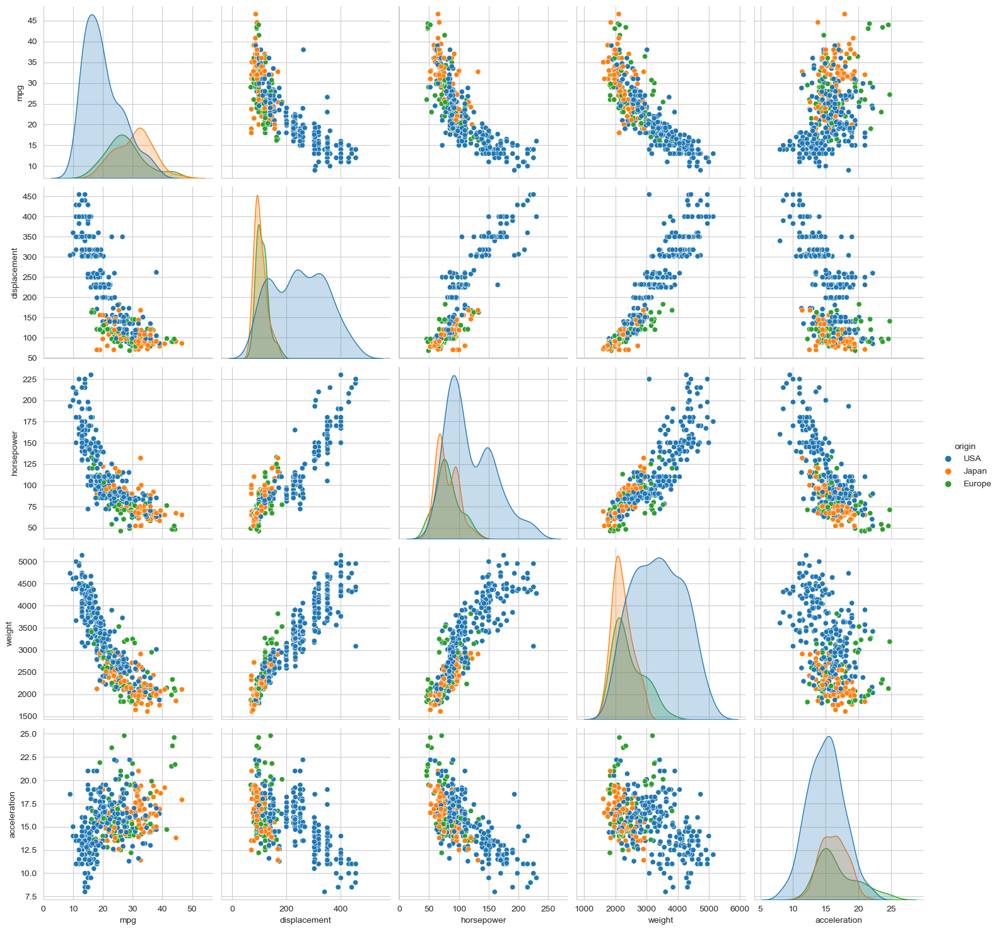

In [10]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

# Construct a logistic regression which models our training data
cls = LogisticRegression()
cls.fit(x_train, y_train)

# Run our testing data against the logistic regression. Is it a good predictor?  
print(classification_report(y_test, cls.predict(x_test)))

# Predict the accuracy of logistic regression for Japan vs. Europe
plt.close();
sns.set_style("whitegrid");
sns.pairplot(auto_mpg_df, hue="origin", height=3);
plt.show()

# Japan vs. Europe: Accuracy of Logistic Regression
* We can now see why Europe was excised from the original dataset. There is a significant overlap with Japan across the board. While the two datasets do differ, they are both closely clustered together.
* As such, we can reason that the performance for logistic regression will similarily not differ. We can simply imagine that, in the course of our experiment, we subsitute the `Japan` dataset for `Europe`, and run it again. Since the two datasets are in similar localities, then the predictive capabilities of the regression should be apposite. 

## Exercise 3 : Polynomial Regression using Gradient Descent (30 points in total)
Now we are going to look into model fitting. In the dataset cost.csv, the first column is the independent variable cost, and the second column is the dependent variable production_output.

## Exercise 3.1 : Split the dataset (5 points)
Import the dataset cost.csv and split them into training and testing set with ratio 70:30.

In [13]:
cost_df = pd.read_csv('cost.csv')

# Break up cost_df into 70:30 training and testing
train, test = train_test_split(cost_df, test_size=0.3, random_state=20)

# x_train is 70% of cost_df (random assignment), with just the one x attribute. Kind of arbitrary
# y_train is 70% of cost_df (random assignment), but with just the other column. Select `cost` as classifying
x_train, y_train = train['production_output'], train['cost']

# x_test is 30% of cost_df (random assignment), with just the one x attribute. Kind of arbitrary
# y_test is 30% of cost_df (random assignment), but with just the other column. Select `cost` as classifying
x_test, y_test = test['production_output'], test['cost']

### Exercise 3.2 - Polynomial Regression (15 points)
Compute the RMSE and R2 for the training and testing set. Using polynomial regression with degree 1, 2, 3, and 4, which model provides the most appropriate prediction? Justify your answer and plot the models fitted line.

--1st degree Polynomial Regression loss functions--
	RMSE: 531.796021879751947
	R2: 0.513928209831187


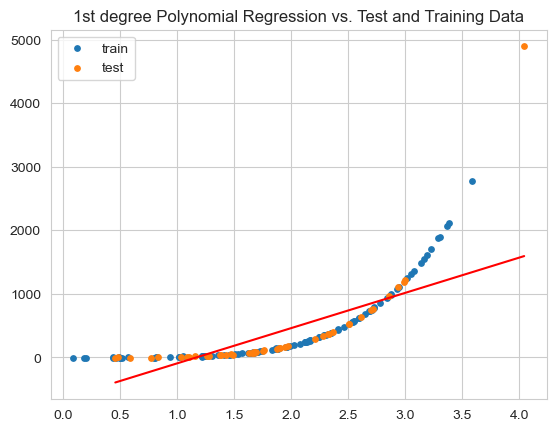

--2nd degree Polynomial Regression loss functions--
	RMSE: 266.384465531824105
	R2: 0.878037016887102


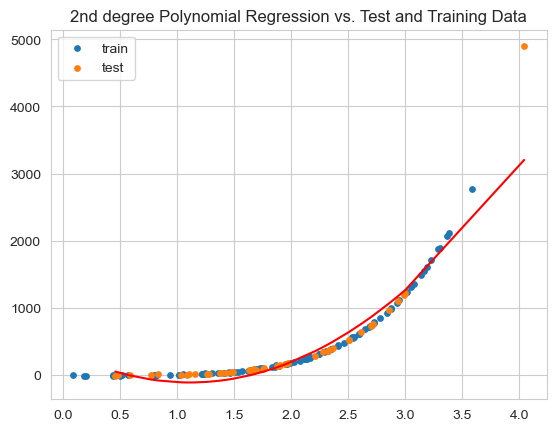

--3rd degree Polynomial Regression loss functions--
	RMSE: 80.444972491979655
	R2: 0.988877355324235


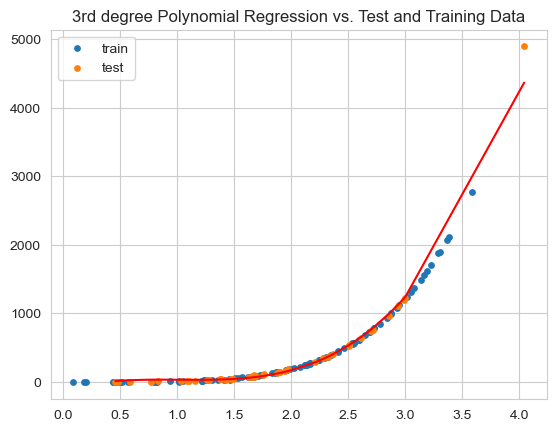

--4th degree Polynomial Regression loss functions--
	RMSE: 14.657973307555821
	R2: 0.999630718032151


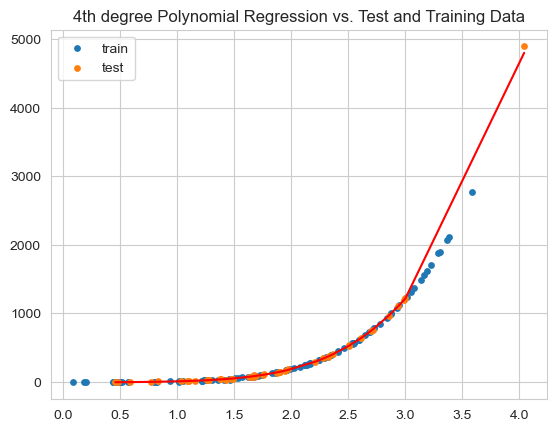

In [75]:
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

# Construct a 1st degree polynomial regression, and determine its RMSE and R2 loss functions
poly = PolynomialFeatures(degree=1, include_bias=False)
X_poly_1 = poly.fit_transform(np.asarray(x_train).reshape(-1, 1))
plr_1 = LinearRegression()

plr_1.fit(X_poly_1, np.asarray(y_train).reshape(-1, 1))

# If we sort now, it will throw off the loss functions
predicted1 = plr_1.predict(poly.transform(np.asarray(x_test).reshape(-1, 1)))

mse = mean_squared_error(y_test,predicted1)
rmse = np.sqrt(mse)
r2 = r2_score(y_test,predicted1)
print('--1st degree Polynomial Regression loss functions--')
print('\tRMSE: %8.15f' % rmse)
print('\tR2: %8.15f' % r2)

# Sort for graphical output. Do this for all 4 polynomial regressions
predicted1 = plr_1.predict(poly.transform(np.asarray(np.sort(x_test)).reshape(-1, 1)))

plt.title("1st degree Polynomial Regression vs. Test and Training Data")
plt.scatter(x_train, y_train, label='train', s = 15)
plt.scatter(x_test, y_test, label='test', s = 15)
plt.plot(np.sort(x_test), predicted1, c="red")
plt.legend()
plt.show()

# Construct a 2nd degree polynomial regression, and determine its RMSE and R2 loss functions
poly = PolynomialFeatures(degree=2, include_bias=False)
X_poly_2 = poly.fit_transform(np.asarray(x_train).reshape(-1, 1))
plr_2 = LinearRegression()

plr_2.fit(X_poly_2, np.asarray(y_train).reshape(-1, 1))

predicted2 = plr_2.predict(poly.transform(np.asarray(x_test).reshape(-1, 1)))
mse = mean_squared_error(y_test,predicted2)
rmse = np.sqrt(mse)
r2 = r2_score(y_test,predicted2)
print('--2nd degree Polynomial Regression loss functions--')
print('\tRMSE: %8.15f' % rmse)
print('\tR2: %8.15f' % r2)

predicted2 = plr_2.predict(poly.transform(np.asarray(np.sort(x_test)).reshape(-1, 1)))

plt.title("2nd degree Polynomial Regression vs. Test and Training Data")
plt.scatter(x_train, y_train, label='train', s = 15)
plt.scatter(x_test, y_test, label='test', s = 15)
plt.plot(np.sort(x_test), predicted2, c='red')
plt.legend()
plt.show()

# Construct a 3rd degree polynomial regression, and determine its RMSE and R2 loss functions
poly = PolynomialFeatures(degree=3, include_bias=False)
X_poly_3 = poly.fit_transform(np.asarray(x_train).reshape(-1, 1))
plr_3 = LinearRegression()

plr_3.fit(X_poly_3, np.asarray(y_train).reshape(-1, 1))

predicted3 = plr_3.predict(poly.transform(np.asarray(x_test).reshape(-1, 1)))
mse = mean_squared_error(y_test,predicted3)
rmse = np.sqrt(mse)
r2 = r2_score(y_test,predicted3)
print('--3rd degree Polynomial Regression loss functions--')
print('\tRMSE: %8.15f' % rmse)
print('\tR2: %8.15f' % r2)
    
predicted3 = plr_3.predict(poly.transform(np.asarray(np.sort(x_test)).reshape(-1, 1)))
plt.title("3rd degree Polynomial Regression vs. Test and Training Data")
plt.scatter(x_train, y_train, label='train', s = 15)
plt.scatter(x_test, y_test, label='test', s = 15)
plt.plot(np.sort(x_test), predicted3, c='red')
plt.legend()
plt.show()

# Construct a 4th degree polynomial regression, and determine its RMSE and R2 loss functions
poly = PolynomialFeatures(degree=4, include_bias=False)
X_poly_4 = poly.fit_transform(np.asarray(x_train).reshape(-1, 1))
plr_4 = LinearRegression()

plr_4.fit(X_poly_4, np.asarray(y_train).reshape(-1, 1))

predicted4 = plr_4.predict(poly.transform(np.asarray(x_test).reshape(-1, 1)))
mse = mean_squared_error(y_test,predicted4)
rmse = np.sqrt(mse)
r2 = r2_score(y_test,predicted4)
print('--4th degree Polynomial Regression loss functions--')
print('\tRMSE: %8.15f' % rmse)
print('\tR2: %8.15f' % r2)

predicted4 = plr.predict(poly.transform(np.asarray(np.sort(x_test)).reshape(-1, 1)))
plt.title("4th degree Polynomial Regression vs. Test and Training Data")
plt.scatter(x_train, y_train, label='train', s = 15)
plt.scatter(x_test, y_test, label='test', s = 15)
plt.plot(np.sort(x_test), predicted4, c='red')
plt.legend()
plt.show()

# Most Appropriate Prediction
* Looking at the graphs, we can see the most complex polynomial (4th degree) is most closely tailored to both the training and testing set. This indicates that there is not signiificant overfitting, since it is performing well on both the training and testing set. The red line (predicted value) is close to the actual testing value (orange dots!))
* Cross-analyzing our loss function, the 4th degree has the best R^2 and Root Mean Square Error values. This is the line of best fit for our `cost.csv` dataset. We used a 30% testing set, which is a generous amount, and implicates that there is not any overfitting occuring (it is performing well against a LARGE incoming test set!). 
* Conclusion: 4th degree provides the most appropriate prediction. 

## Exercise 4 : Log Likelihood (27 points in total)
For a model with two independent variables x1 (Weight) and x2 (Length), compute the log-likelihood for the model: ŷ = 0.1 x1 + 0.1 x2 , where the dependent variable ŷ represents the prediction for Height. Given the dataset below (in the table), assuming that the measurements have normal distribution, please complete the table. 

Round your answer to 4 d.p. For simplicity, use and log base 10.

Hint: $f(y_i)=\frac{1}{\sqrt{2\piσ^2}}e^{\frac{-(y_i-ŷ_i)^2}{2σ^2}}$

Model 1: 
Weight x1 | Length x2 | Actual Height y | Predicted Height ŷ | squared residual (y - ŷ )^2 | Log-Likelihood
---|---|---|---|---|---|
7.0 | 50 | 5.80
6.0 | 55 | 5.70
8.0 | 56 | 6.00

In [141]:
# Run a loop which computes Predicted Height, Squared Residual, and Log-Likelihood for each indicated column

# Given parameters loaded into numpy
x1 = np.array([7.0, 6.0, 8.0])
x2 = np.array([50.0, 55.0, 56.0])
y = np.array([5.8, 5.7, 6.0])

# Calculated parameters to be stored
y_hat = np.empty([3])
sq_res = np.empty([3])
log_likelihood = np.empty([3])

print("`Weight`\t`Length`\t`Actual Height`\t    `Predicted Height`\t    `Squared Residual`\t     `Log-Likelihood`")
for i in range (0, 3):
     # Predicted height for row i
    y_hat[i] = 0.1 * x1[i] + 0.1 * x2[i]
    
    # Squared residual for row i
    sq_res[i] = np.square(y[i] - y_hat[i])
    
   # The log likelihood function, as derived from the normal distribution. Log base 10 is already applied. For a SINGLE random variable only. 
   # Sigma depends on our distribution. Sicne we are dealing with an ideal normal PDF, we can say it is 1
    sigma = 1
    log_likelihood[i] =  - ((1 / 2) * np.log10(2 * np.pi)) - np.log10(sigma) - (sq_res[i] / (2 * np.square(sigma)))
    
    print(f"  {x1[i]}             {x2[i]}                {y[i]}                  {y_hat[i]}                   {np.format_float_positional(sq_res[i], precision = 4)}                  {np.format_float_positional(log_likelihood[i], precision = 4)}")
    
    
    

`Weight`	`Length`	`Actual Height`	    `Predicted Height`	`    Squared Residual`	     `Log-Likelihood`
  7.0             50.0                5.8                  5.7                   0.01                  -0.4041
  6.0             55.0                5.7                  6.1                   0.16                  -0.4791
  8.0             56.0                6.0                  6.4                   0.1600                  -0.4791
